# 1. Introducción
Para el proyecto SOILDIVERAGRO (http://soildiveragro.eu/), tenéis que intentar predecir propiedades físico
químicas de muestras de suelo a partir de sus espectros infrarojos.

# 2. Carga de los espectros.
El fichero que contiene los spectros es 'spectros.csv'.
La primera fila contiene las longitudes de onda en el spectro, se debe usar como nombres de columnas.
Además la primera columna contiene el identificador de la muestra, que se debe usar como index del
DataFrame.

In [3]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from pathlib import Path

DATA_DIRECTORY : Path = Path("..")/"data";

espectros = pd.read_csv(
    # Spectros csv tiene los datos girados,
    DATA_DIRECTORY / "spectros.csv",
    sep=",",
    index_col=0,
)
espectros

,399.6811,400.1632,400.6453,401.1275,401.6096,402.0917,402.5739,403.056,403.5381,404.0202,...,3995.846,3996.329,3996.811,3997.293,3997.775,3998.257,3998.739,3999.221,3999.704,4000.186
sample_id,,,,,,,,,,,,,,,,,,,,,
PANO5A,0.0,1.987760,2.005823,2.033784,2.071113,2.116056,2.164896,2.211573,2.248146,2.266811,...,0.949940,0.949853,0.949796,0.949763,0.949750,0.949752,0.949763,0.949779,0.949790,0.949785
ACC9A,0.0,1.610176,1.638879,1.681727,1.739360,1.809958,1.887661,1.961427,2.016727,2.042494,...,0.840901,0.840553,0.839953,0.839161,0.838236,0.837222,0.836162,0.835104,0.834104,0.833228
MNC1A,0.0,1.954524,1.955039,1.959296,1.967656,1.979167,1.991473,2.001418,2.006041,2.003782,...,0.771581,0.771479,0.771391,0.771314,0.771246,0.771184,0.771125,0.771069,0.771018,0.770972
CONO4A,0.0,1.851054,1.876747,1.904768,1.935830,1.969493,2.003501,2.033980,2.056429,2.067519,...,0.761841,0.761776,0.761718,0.761672,0.761642,0.761626,0.761622,0.761628,0.761636,0.761643
PANO3B,0.0,2.050345,2.047443,2.039432,2.033314,2.035221,2.048990,2.075728,2.113797,2.158910,...,0.991595,0.991506,0.991412,0.991332,0.991286,0.991287,0.991335,0.991418,0.991510,0.991581
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ANC1B,0.0,1.831178,1.845217,1.867835,1.896745,1.928163,1.957258,1.979461,1.991939,1.994491,...,0.813012,0.813056,0.813112,0.813162,0.813188,0.813179,0.813132,0.813055,0.812963,0.812873
BORO5B,0.0,2.287096,2.275130,2.224253,2.152820,2.080450,2.019536,1.975511,1.949358,1.939503,...,0.955243,0.955114,0.955015,0.954943,0.954891,0.954854,0.954832,0.954825,0.954836,0.954859
MSC5A,0.0,2.032349,2.045980,2.066124,2.095961,2.137268,2.189469,2.248850,2.308043,2.356906,...,0.855547,0.855497,0.855425,0.855326,0.855197,0.855049,0.854899,0.854768,0.854675,0.854625


# 3. Preparación de los datos de espectros
Se suele recomendar descartar las longitudes de onda extremas. Por lo tanto, tendréis que empezar por
descartar las columnas que corresponden a longitudes de onda inferiores a 700 y superiores a 4000. (si
hay)
Para muchas de las muestras, se disponen de varias repeticiones del espectro. Para empezar, obtened la
distribución del número de spectros disponibles por muestra. Es decir, cuántas muestras tienen 1
spectro, cuántas muestros tienen dos spectros, etc…
Tenéis que contruir un nuevo dataframe, que contenga, para cada muestra de suelo, el espectro
promedio, construido, para cada longitud de onda, como promedio de valores correspondientes de los
espectros disponibles para esta muestra.
A partir de ahora, trabajaréis con este nuevo dataframe, que contiene una fila para cada muestra de suelo, y
que sólo contenga las columnas correspondientes a longitudes de onda entre 700 y 4000.

In [4]:
# Borrar columnas <700 y >4000
# Seleccionar columnas con nombres (longitudes de onda) entre 700 y 4000 y las filtramos :,(condicion de la columna)
espectros.columns = espectros.columns.astype(float) # Convertimos a float
espectros = espectros.loc[:, (espectros.columns >= 700) & (espectros.columns <= 4000)]

espectros

,700.0446,700.5267,701.0088,701.4909,701.9730,702.4552,702.9373,703.4194,703.9016,704.3837,...,3995.3650,3995.8460,3996.3290,3996.8110,3997.2930,3997.7750,3998.2570,3998.7390,3999.2210,3999.7040
sample_id,,,,,,,,,,,,,,,,,,,,,
PANO5A,2.200459,2.191000,2.181384,2.171989,2.163233,2.155521,2.149177,2.144337,2.140887,2.138443,...,0.950051,0.949940,0.949853,0.949796,0.949763,0.949750,0.949752,0.949763,0.949779,0.949790
ACC9A,2.025499,2.012786,1.999454,1.986143,1.973149,1.960517,1.948182,1.936091,1.924275,1.912846,...,0.840935,0.840901,0.840553,0.839953,0.839161,0.838236,0.837222,0.836162,0.835104,0.834104
MNC1A,1.945433,1.938312,1.930948,1.923514,1.916162,1.909016,1.902181,1.895767,1.889917,1.884817,...,0.771693,0.771581,0.771479,0.771391,0.771314,0.771246,0.771184,0.771125,0.771069,0.771018
CONO4A,1.929230,1.913338,1.896332,1.878618,1.860574,1.842541,1.824816,1.807649,1.791238,1.775739,...,0.761906,0.761841,0.761776,0.761718,0.761672,0.761642,0.761626,0.761622,0.761628,0.761636
PANO3B,2.220407,2.213904,2.207026,2.200106,2.193477,2.187375,2.181875,2.176887,2.172204,2.167579,...,0.991665,0.991595,0.991506,0.991412,0.991332,0.991286,0.991287,0.991335,0.991418,0.991510
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ANC1B,1.974100,1.962164,1.949594,1.936797,1.924077,1.911609,1.899453,1.887603,1.876047,1.864826,...,0.812990,0.813012,0.813056,0.813112,0.813162,0.813188,0.813179,0.813132,0.813055,0.812963
BORO5B,2.141517,2.136838,2.132068,2.127350,2.122826,2.118616,2.114772,2.111264,2.107972,2.104720,...,0.955396,0.955243,0.955114,0.955015,0.954943,0.954891,0.954854,0.954832,0.954825,0.954836
MSC5A,1.996201,1.992033,1.988232,1.984817,1.981719,1.978827,1.976043,1.973311,1.970642,1.968115,...,0.855586,0.855547,0.855497,0.855425,0.855326,0.855197,0.855049,0.854899,0.854768,0.854675


# 4. Representación gráfica
Obtened la representación gráfica del espectro (valor del espectro frente a longitud de onda) de cualquiera de
las muestras de suelo.

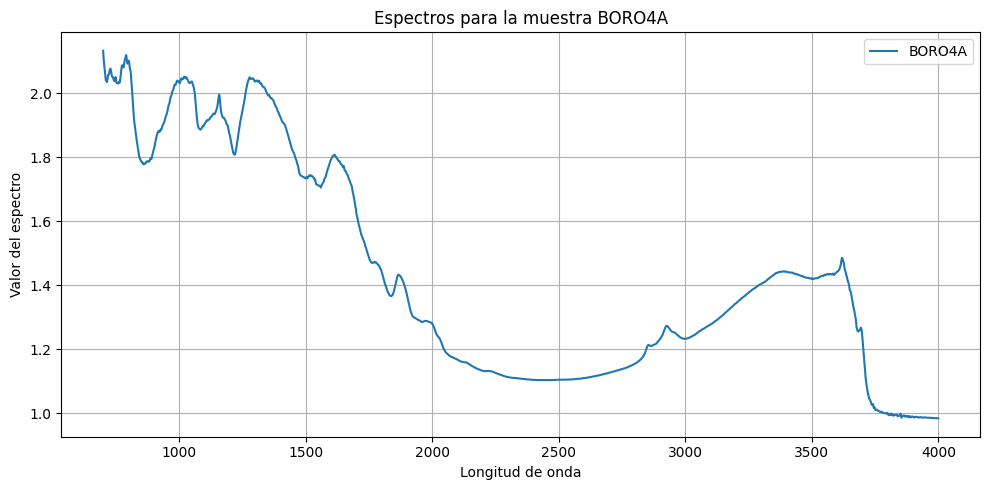

In [9]:
indice_espectro = espectros.iloc[100]
indice_espectro


fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(espectros.columns, indice_espectro.values, label=f"{indice_espectro.name}")
ax.legend()
ax.set_title(f"Espectros para la muestra {indice_espectro.name}")
ax.set_xlabel("Longitud de onda")
ax.set_ylabel("Valor del espectro")
ax.grid(True)
plt.tight_layout()
plt.show()

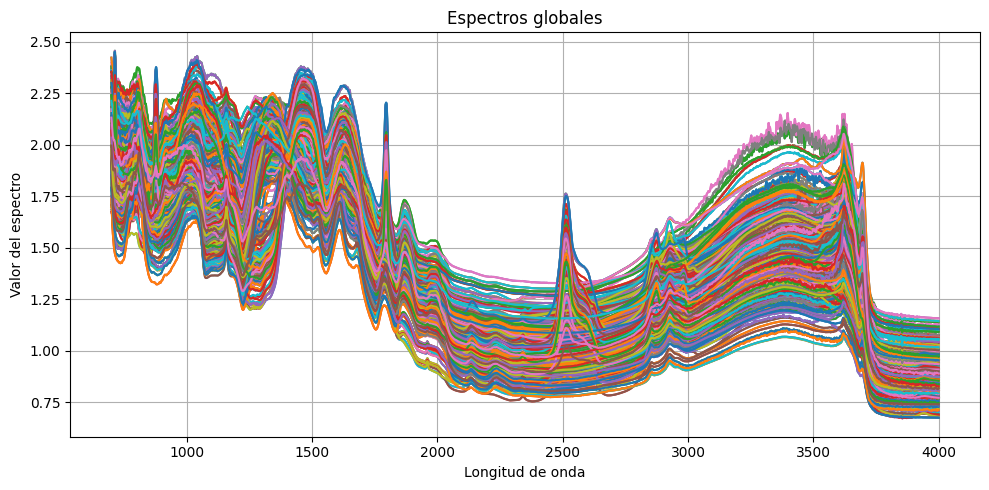

In [100]:
indice_espectro = espectros.index
espectro = espectros.loc[indice_espectro]

espectros_repetidos = espectros.loc[indice_espectro]

fig, ax = plt.subplots(figsize=(10, 5))
for i, (_,fila) in enumerate(espectros_repetidos.iterrows(), start=1):
    ax.plot(espectros.columns, fila.values, label=f"{indice_espectro} - {i}")

ax.set_title(f"Espectros globales")
ax.set_xlabel("Longitud de onda")
ax.set_ylabel("Valor del espectro")
ax.grid(True)
plt.tight_layout()
plt.show()

# 5. Carga del pH
Para cada muestra de suelo, se llevó a cabo la medición del pH. Los datos se encuentran en el fichero 'pH.csv'
La primera columna corresponde al identificador de la muestra, al igual que en el archivo precedente.
Después de cargar los datos de pH, juntarlos con los spectros, en un único DataFrame.
Realizad un boxplot de pH.

In [101]:
ph_measures = pd.read_csv(
    # Spectros csv tiene los datos girados,
    DATA_DIRECTORY / "pH.csv",
    sep=",",
    index_col=0,
)
ph_measures

,pH_w
sample_id,
ACO1A,7.87
ACO1B,7.34
ACO1C,6.72
ACO2A,6.20
ACO3A,7.62
...,...
PANO3B,7.83
PANO4A,7.97
PANO4B,7.45


# 6. Predicción del pH a partir del espectro.
El objetivo es llevar a cabo la predicción del valor del pH de la muestra a partir de su espectro. Puesto que el
número de características (features) es muy elevado para el tamaño del conjunto de datos que tenemos,
nuestro procedimiento de predicción incluirá dos pasos:
1. Reducción del número de características usando componentes principales
2. Regresión lineal usando las 20 componentes principales resultantes del análisis anterior.


Definir el algoritmo correspondiente, realizar su ajuste y evaluar su comportamiento, habiendo separado en el
conjunto una parte para entrenamiento y otra parte para test.
Realizar un boxplot de los errores de predicción para el conjunto de test.
Os parece buena la capacidad de predicción de nuestro algoritmo?
Queremos probar 5, 10, 30 componentes en el primer paso de nuestro algoritmo. Buscar cuál es el mejor
valor de este hiperparámetro.

In [144]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.decomposition import PCA


In [133]:
X = espectros.values
y = ph_measures.values.ravel()
print(f'Forma de X (espectros): {X.shape}')
print(f'Forma de y (pH): {y.shape}')

Forma de X (espectros): (395, 6845)
Forma de y (pH): (188,)


In [140]:
# Promediaré los espectros con el mismo indice para asi tener un solo espectro por pH
ids_con_ph = ph_measures.index
espectros_para_promediar = espectros[espectros.index.isin(ids_con_ph)]
espectros_promediados_df = espectros_para_promediar.groupby(espectros_para_promediar.index).mean()

X = espectros_promediados_df.values
y = ph_measures.values.ravel()
print(f'Forma de X (espectros): {X.shape}')
print(f'Forma de y (pH): {y.shape}')

Forma de X (espectros): (188, 6845)
Forma de y (pH): (188,)


In [173]:
ridgeProc = Pipeline([
    ('scaler_orig', StandardScaler()),
    ('pca', PCA(n_components=20)),
    ('reg_ridge', Ridge(alpha=1.0))
])



In [174]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [175]:
ridgeProc.fit(X_train,y_train)

Pipeline(steps=[('scaler_orig', StandardScaler()),
                ('pca', PCA(n_components=20)), ('reg_ridge', Ridge())])

In [176]:
y_predict = ridgeProc.predict(X_test)

In [177]:
mse_pipeline = mean_squared_error(y_test, y_predict)
rmse_pipeline = np.sqrt(mse_pipeline)
r2_pipeline = r2_score(y_test, y_predict)

In [178]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [180]:
print(f"Número de componentes PCA: {ridgeProc.named_steps['pca'].n_components}")

print(f"Ridge alpha: {ridgeProc.named_steps['reg_ridge'].alpha}")
print(f"MSE en Test: {mse_pipeline:.4f}")
print(f"RMSE en Test: {rmse_pipeline:.4f}")
print(f"R² en Test: {r2_pipeline:.4f}")

Número de componentes PCA: 20
Ridge alpha: 1.0
MSE en Test: 0.1958
RMSE en Test: 0.4424
R² en Test: 0.7741


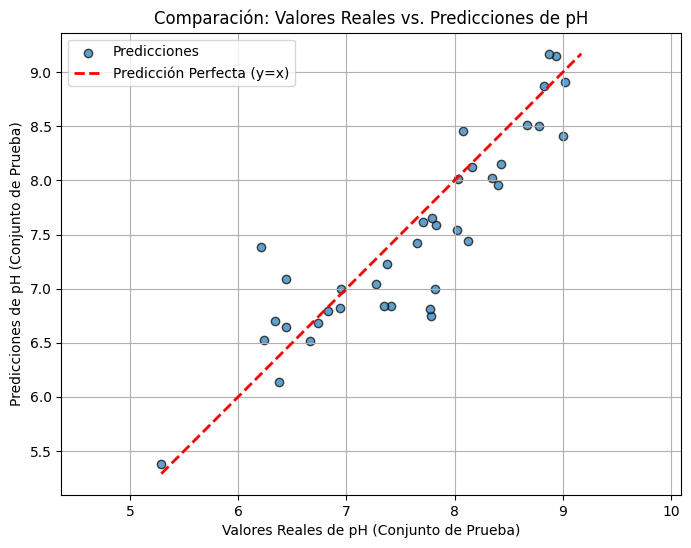

In [ ]:
y_test_flat = np.array(y_test).ravel()
y_pred_flat = np.array(y_predict).ravel()

plt.figure(figsize=(8, 6))
plt.scatter(y_test_flat, y_pred_flat, alpha=0.7, edgecolors='k', label='Predicciones')

min_val = min(y_test_flat.min(), y_pred_flat.min())
max_val = max(y_test_flat.max(), y_pred_flat.max())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label='Predicción Perfecta (y=x)')

plt.xlabel("Valores Reales de pH (Conjunto de Prueba)")
plt.ylabel("Predicciones de pH (Conjunto de Prueba)")
plt.title("Comparación: Valores Reales vs. Predicciones de pH")
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

# 7. Explorar otros algoritmos para la predicción
Podéis intentar usar otros algoritmos para la predicción del pH a partir de los espectros. En este caso,
proporcionad una comparación con el propuesto en la sección anterior.